## IMPORTS

In [4]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

## RECORTE

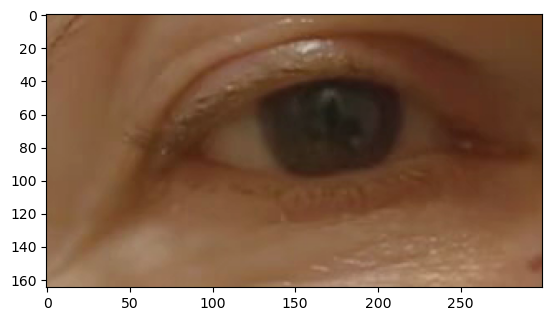

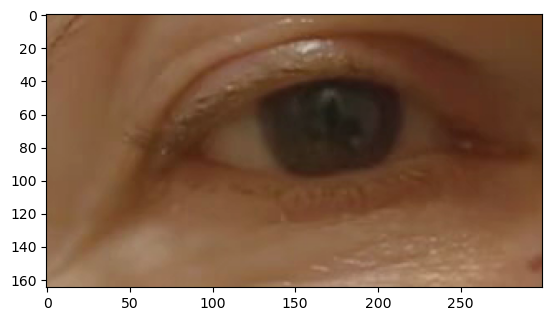

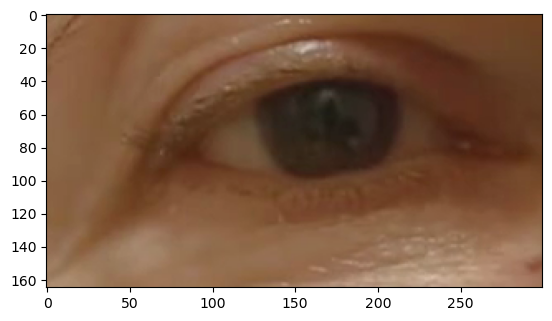

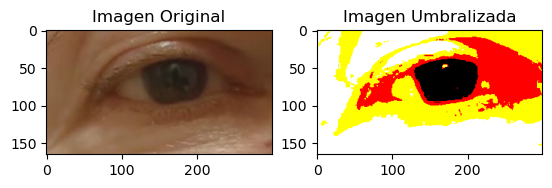

In [5]:
# Abre el video
#cap = cv2.VideoCapture('./img/nistagmus.mp4')
cap = cv2.VideoCapture('./img/nistagmus.mp4', cv2.IMREAD_GRAYSCALE)

cont = 0
while True:
    # Lee un frame
    ret, frame = cap.read()
    
    # Si no hay más frames, rompe el bucle
    if not ret:
        break
    
    # Convierte el frame a RGB (OpenCV usa BGR por defecto)
    #frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    #plt.imshow(frame, cmap='gray')
    #frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    imageOut = frame[235:400,250:550]

    
    
    # Muestra el frame con plt.imshow
    plt.imshow(imageOut)
    plt.pause(0.03)  # Pausa por un corto período de tiempo antes de mostrar el próximo frame
    cont += 1
    if cont >= 3:
        break
# Libera el objeto de captura de video
_, thresholded = cv2.threshold(imageOut, 60, 255, cv2.THRESH_BINARY)
plt.subplot(1, 2, 1)
plt.imshow(imageOut)
plt.title('Imagen Original')
plt.subplot(1, 2, 2)
plt.imshow(thresholded)
plt.title('Imagen Umbralizada')
plt.show()

cap.release()

# Cierra todas las ventanas de plt
plt.close('all')
#plt.imshow(cv2.cvtColor(imageOut, cv2.COLOR_RGB2GRAY))
#plt.imshow(imageOut, cmap='gray')


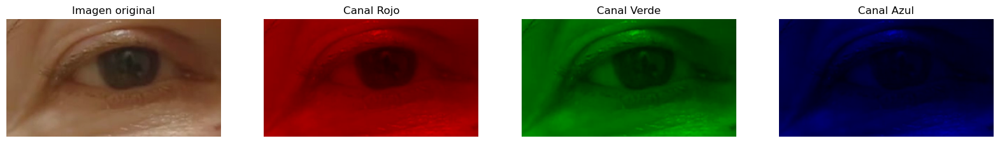

In [6]:
# Leer la imagen y convertirla a RGB
#img = cv2.imread("img/lena_std.tif")
#img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Crear copias de la imagen para aislar cada canal
imageOutR = imageOut.copy()
imageOutG = imageOut.copy()
imageOutB = imageOut.copy()

# Aislar el canal R
imageOutR[:, :, 1] = 0  # Green
imageOutR[:, :, 2] = 0  # Blue :(dos puntos es todas :(filas), :(columnas), R || G || B (QUITAR CANAL))

# Aislar el canal G
imageOutG[:, :, 0] = 0  # R
imageOutG[:, :, 2] = 0  # B

# Aislar el canal B
imageOutB[:, :, 0] = 0  # R
imageOutB[:, :, 1] = 0  # G

# Visualizar las imágenes
fig, ax = plt.subplots(1, 4, figsize=(20, 5))

ax[0].imshow(imageOut)
ax[0].set_title("Imagen original")
ax[0].axis('off')

ax[1].imshow(imageOutR)
ax[1].set_title("Canal Rojo")
ax[1].axis('off')

ax[2].imshow(imageOutG)
ax[2].set_title("Canal Verde")
ax[2].axis('off')

ax[3].imshow(imageOutB)
ax[3].set_title("Canal Azul")
ax[3].axis('off')

plt.show()

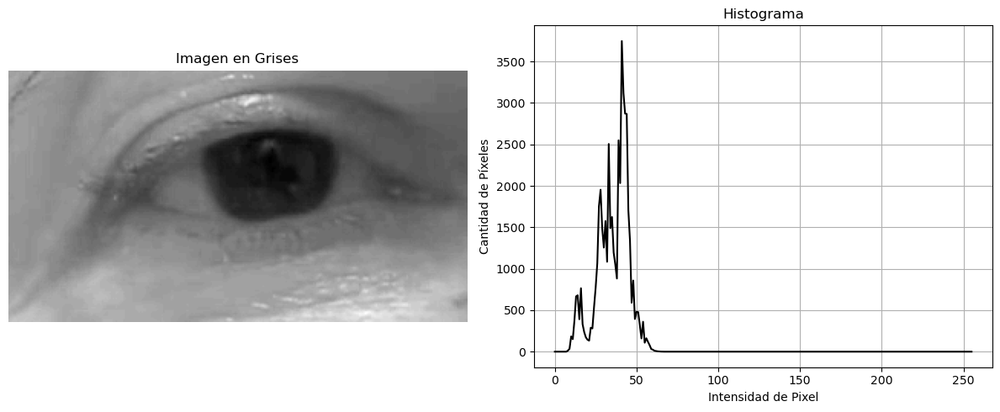

In [7]:
img = cv2.cvtColor(imageOutR, cv2.COLOR_RGB2GRAY)  # Leer en escala de grises directamente

# Calcular el histograma
hist = cv2.calcHist([img], [0], None, [256], [0, 256])

# Visualizar la imagen y su histograma
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen en Grises")
ax[0].axis('off')

# Mostrar el histograma
ax[1].plot(hist, color='black')
ax[1].set_title("Histograma")
ax[1].set_xlabel("Intensidad de Pixel")
ax[1].set_ylabel("Cantidad de Píxeles")
ax[1].grid(True)

plt.tight_layout()
plt.show()

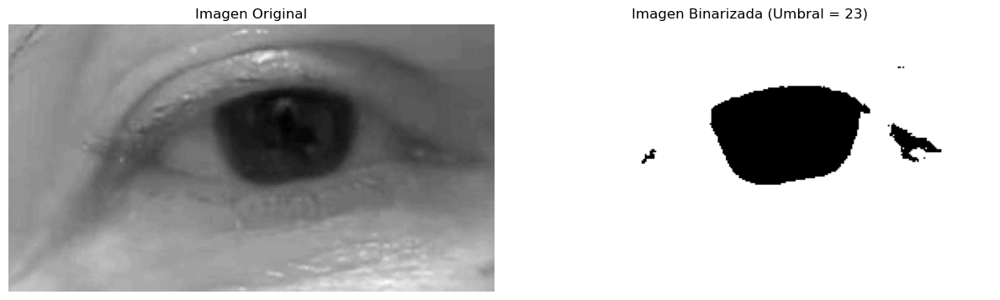

In [8]:
umbral = 23  # Puedes cambiar este valor según tus necesidades

# Binarizar la imagen
_, img_binarizada = cv2.threshold(img, umbral, 255, cv2.THRESH_BINARY)

# Visualizar la imagen original y la imagen binarizada
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen Original")
ax[0].axis('off')

# Mostrar la imagen binarizada
ax[1].imshow(img_binarizada, cmap='gray')
ax[1].set_title(f"Imagen Binarizada (Umbral = {umbral})")
ax[1].axis('off')

plt.tight_layout()
plt.show()

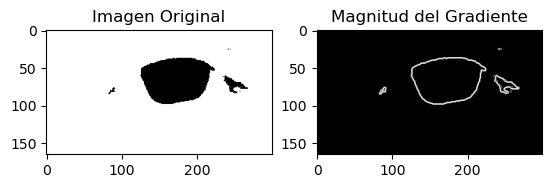

In [9]:
sobel_x = cv2.Sobel(img_binarizada, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(img_binarizada, cv2.CV_64F, 0, 1, ksize=3)
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
plt.subplot(1, 2, 1)
plt.imshow(img_binarizada, cmap='gray')
plt.title('Imagen Original')
plt.subplot(1, 2, 2)
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Magnitud del Gradiente')
plt.show()

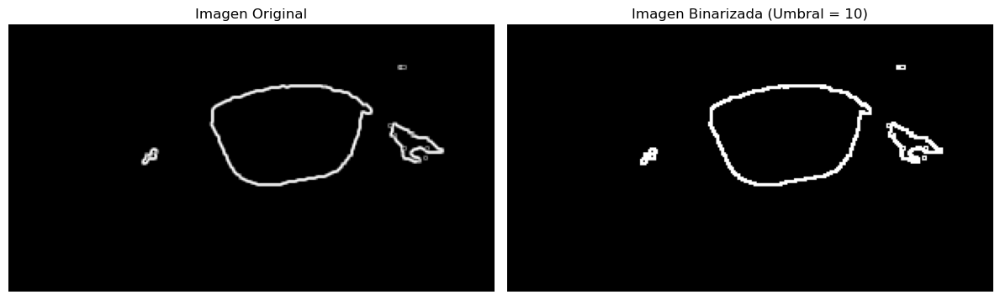

In [10]:
umbral = 10  # Puedes cambiar este valor según tus necesidades

# Binarizar la imagen
_, img_binarizada = cv2.threshold(gradient_magnitude, umbral, 255, cv2.THRESH_BINARY)

# Visualizar la imagen original y la imagen binarizada
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(gradient_magnitude, cmap='gray')
ax[0].set_title("Imagen Original")
ax[0].axis('off')

# Mostrar la imagen binarizada
ax[1].imshow(img_binarizada, cmap='gray')
ax[1].set_title(f"Imagen Binarizada (Umbral = {umbral})")
ax[1].axis('off')

plt.tight_layout()
plt.show()

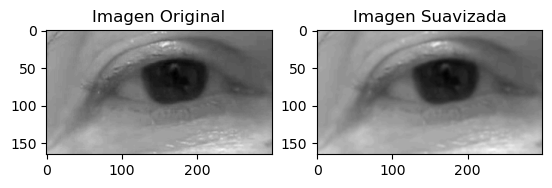

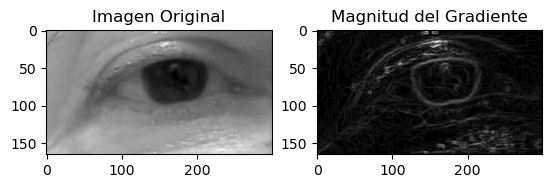

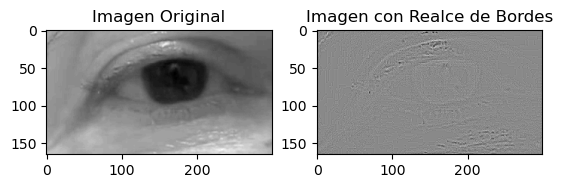

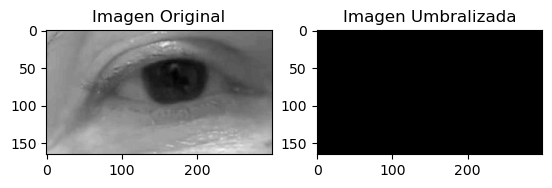

In [11]:
import cv2
import matplotlib.pyplot as plt

# Cargar una imagen en escala de grises
image = img

# Filtro de Suavizado (Blur)
blurred = cv2.GaussianBlur(image, (5, 5), 0)
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Imagen Original')
plt.subplot(1, 2, 2)
plt.imshow(blurred, cmap='gray')
plt.title('Imagen Suavizada')
plt.show()

# Filtro de Detección de Bordes (Sobel)
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Imagen Original')
plt.subplot(1, 2, 2)
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Magnitud del Gradiente')
plt.show()

# Filtro de Realce de Bordes (Laplacian)
laplacian = cv2.Laplacian(image, cv2.CV_64F)
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Imagen Original')
plt.subplot(1, 2, 2)
plt.imshow(laplacian, cmap='gray')
plt.title('Imagen con Realce de Bordes')
plt.show()

# Filtro de Umbralización (Thresholding)
_, thresholded = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Imagen Original')
plt.subplot(1, 2, 2)
plt.imshow(thresholded, cmap='gray')
plt.title('Imagen Umbralizada')
plt.show()


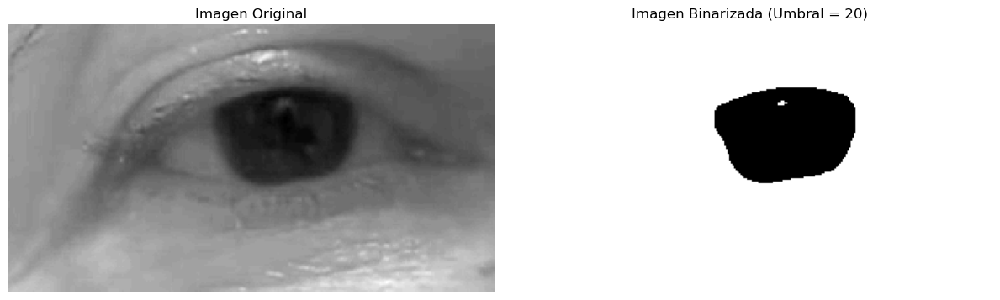

In [12]:
umbral = 20 # Puedes cambiar este valor según tus necesidades

# Binarizar la imagen
_, img_binarizada = cv2.threshold(blurred, umbral, 255, cv2.THRESH_BINARY)

# Visualizar la imagen original y la imagen binarizada
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Mostrar la imagen en escala de grises
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Imagen Original")
ax[0].axis('off')

# Mostrar la imagen binarizada
ax[1].imshow(img_binarizada, cmap='gray')
ax[1].set_title(f"Imagen Binarizada (Umbral = {umbral})")
ax[1].axis('off')

plt.tight_layout()
plt.show()

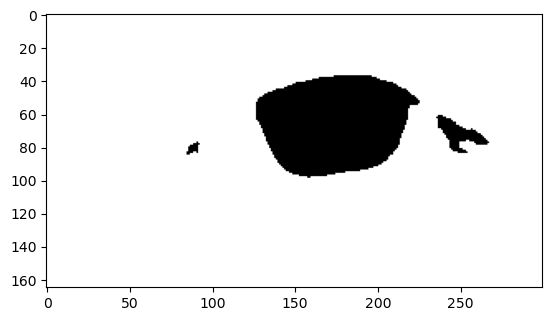

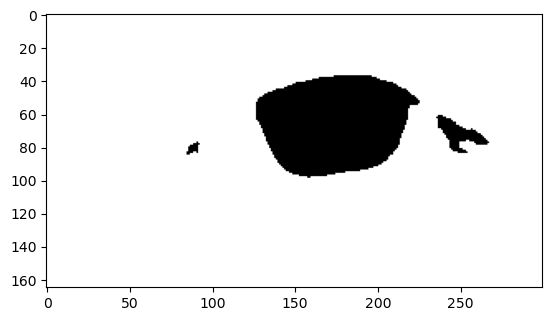

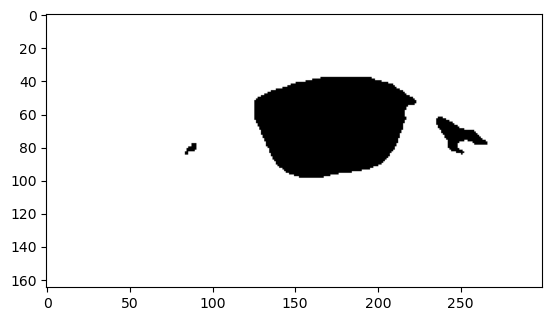

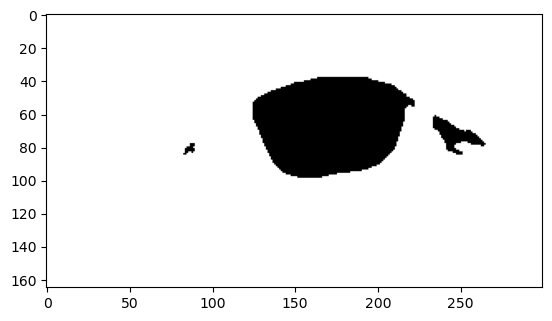

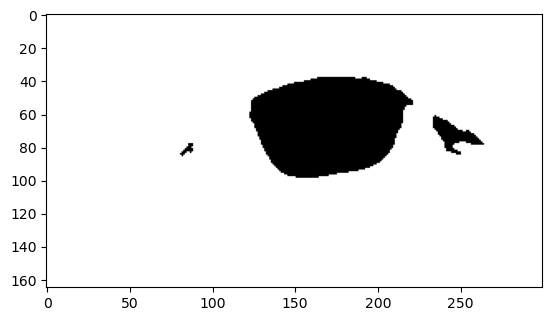

...

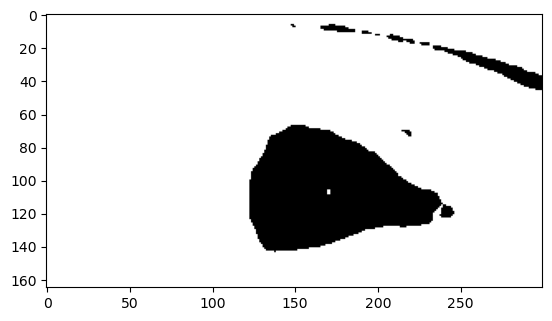

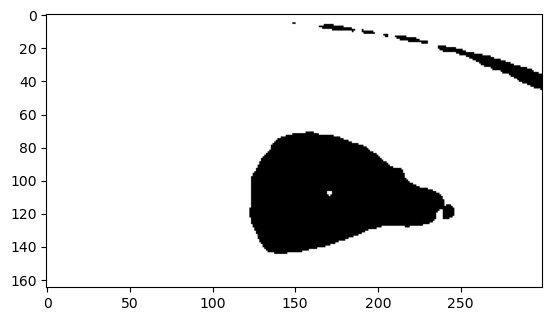

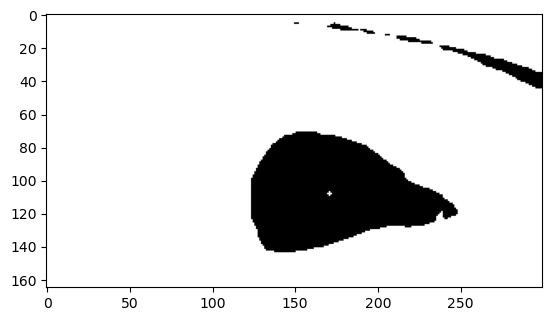

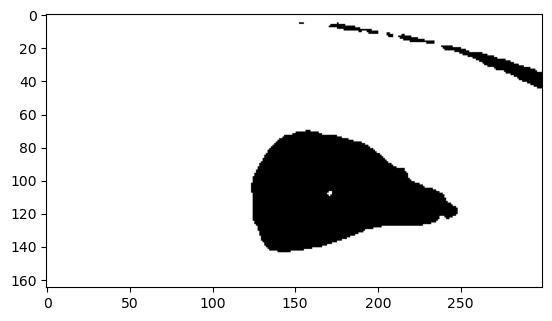

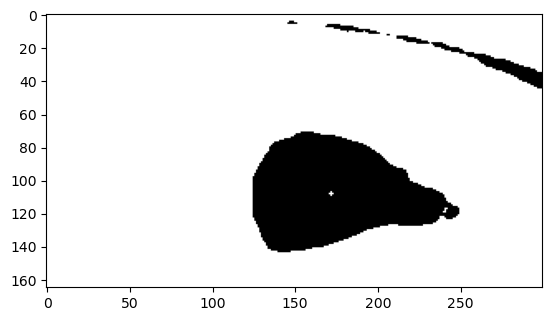

In [13]:
cap = cv2.VideoCapture('./img/nistagmus.mp4', cv2.IMREAD_GRAYSCALE)

cont = 0
while True:
    # Lee un frame
    ret, frame = cap.read()
    
    # Si no hay más frames, rompe el bucle
    if not ret:
        break
    
    # Convierte el frame a RGB (OpenCV usa BGR por defecto)
    #frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    #plt.imshow(frame, cmap='gray')
    #frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    imageOut = frame[235:400,250:550]

    # Crear copias de la imagen para aislar cada canal
    imageOutR = imageOut.copy()

    imageOutR[:, :, 1] = 0
    imageOutR[:, :, 2] = 0

    frame = cv2.cvtColor(imageOutR, cv2.COLOR_RGB2GRAY)

    # Filtro de Suavizado (Blur)
    blurred = cv2.GaussianBlur(frame, (5, 5), 0)

    umbral = 23 # Puedes cambiar este valor según tus necesidades

    # Binarizar la imagen
    _, img_binarizada = cv2.threshold(blurred, umbral, 255, cv2.THRESH_BINARY)    
    
    # Muestra el frame con plt.imshow
    plt.imshow(img_binarizada, cmap='gray')
    plt.pause(0.03)  # Pausa por un corto período de tiempo antes de mostrar el próximo frame
    cont += 1
    if cont >= 500:
        break

cap.release()

# Cierra todas las ventanas de plt
plt.close('all')